In [217]:
import torch
import numpy as np
import matplotlib.pyplot as plt

def smoothGrad(img, n, model, target_label, std_weight=1.1):
    image_array = np.array(img)
    std_dev = np.std(image_array)*std_weight

    sailency_total = np.zeros((1, 3, 224, 224))
    
    for i in range(n):
        
        gaussian_noise = np.random.normal(0, std_dev**2, size=img.shape)
        img_with_noise = img+gaussian_noise
        img_with_noise_batch = img_with_noise.unsqueeze(0).float()
        
        if torch.cuda.is_available():
            img_with_noise_batch = img_with_noise_batch.to('cuda')
        img_with_noise_batch.requires_grad = True

        output = model(img_with_noise_batch)
        S_c = output[0, target_label]
        #print('score', S_c)
        model.zero_grad()
        S_c.backward()
        
        
        gradient = img_with_noise_batch.grad.data
        sailency_total += gradient.cpu().numpy()
        
        if img_with_noise_batch.grad != None:
            img_with_noise_batch.grad.zero_()
            
    avg_gradients = sailency_total / n
    return avg_gradients
     
        

Predicted label: n03250847 (drumstick)


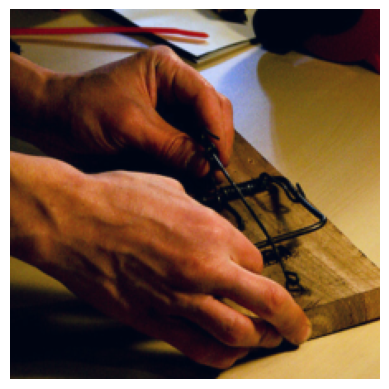

Predicted label: n01806143 (peacock)


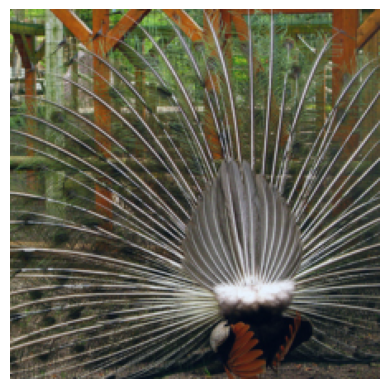

Predicted label: n03938244 (pillow)


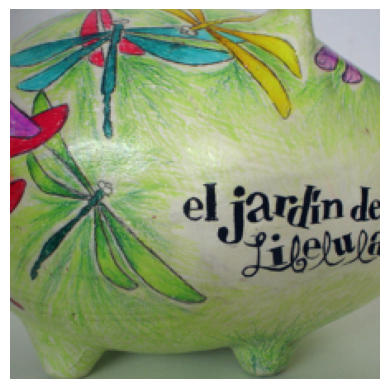

Predicted label: n03792782 (mountain_bike)


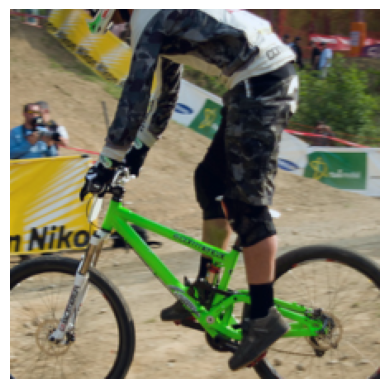

Predicted label: n04118776 (rule)


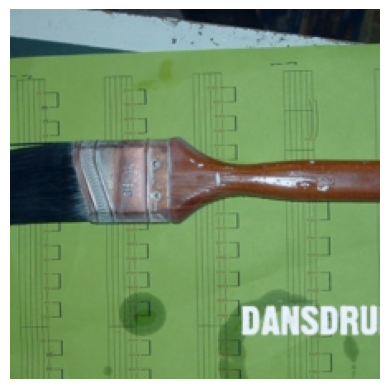

In [183]:
import torch
import torchvision.transforms as transforms
import torchvision.models as models
from PIL import Image
import json
import os 

# Load the pre-trained ResNet18 model
model = models.resnet18(pretrained=True)
model.eval()  # Set model to evaluation mode

# Define the image preprocessing transformations
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]   
    )
])

# Load the ImageNet class index mapping
with open("imagenet_class_index.json") as f:
    class_idx = json.load(f)
idx2label = [class_idx[str(k)][1] for k in range(len(class_idx))]
idx2synset = [class_idx[str(k)][0] for k in range(len(class_idx))]
id2label = {v[0]: v[1] for v in class_idx.values()}

idx2label_explanation = [class_idx[str(k)][1] for k in range(len(class_idx))]
idx2synset_explanation = [class_idx[str(k)][0] for k in range(len(class_idx))]
id2label_explanation = {v[0]: v[1] for v in class_idx.values()}

imagenet_path = './imagenet_samples'

# List of image file paths\
image_paths = [f for f in os.listdir(imagenet_path) if not f.startswith('.')]
#image_paths = [image_paths[4]]
for img_path in image_paths:
    # Open and preprocess the image
    my_img = os.path.join(imagenet_path, img_path)
    input_image = Image.open(my_img).convert('RGB')
    input_tensor = preprocess(input_image)
    input_batch = input_tensor.unsqueeze(0)  # Create a mini-batch as expected by the model

    # Move the input and model to GPU if available
    if torch.cuda.is_available():
        input_batch = input_batch.to('cuda')
        model.to('cuda')

    # Perform inference
    with torch.no_grad():
        output = model(input_batch)
    # Get the predicted class index
    _, predicted_idx = torch.max(output, 1)
    predicted_idx = predicted_idx.item()
    predicted_synset = idx2synset[predicted_idx]
    predicted_label = idx2label[predicted_idx]
    
    predicted_class = torch.argmax(output, dim=1).item()
    print(f"Predicted label: {predicted_synset} ({predicted_label})")

    smooth_grad = smoothGrad(input_tensor, 10, model, predicted_class)
    smooth_grad -= smooth_grad.min() 
    smooth_grad /= smooth_grad.max()
    plt.imshow(np.transpose(smooth_grad.squeeze(), (1, 2, 0)), cmap='gray')
    
    plt.axis('off')
    plt.show()

In [240]:
def pgd_attack_smoothgrad(model, input_img, smooth_grad_original, target_label, eps, alpha, num_steps, weight1 = 1, weight2 = 1):
 
    perturbed_img = input_img.clone().detach().requires_grad_(True)

    for step in range(num_steps):
        smooth_grad_perturbed = smoothGrad(perturbed_img, 10, model, target_label)

        #put them in same device
        smooth_grad_original_tensor = torch.tensor(smooth_grad_original).to(input_img.device)        
        smooth_grad_perturbed_tensor = torch.tensor(smooth_grad_perturbed).to(input_img.device)

        MSE_loss = -torch.mean((smooth_grad_perturbed_tensor - smooth_grad_original_tensor) ** 2)


        output = model(perturbed_img.unsqueeze(0))
        cross_entropy_loss = torch.nn.functional.cross_entropy(output, torch.tensor([target_label]).to(output.device))

        total_loss = weight1 * MSE_loss + weight2*cross_entropy_loss
        total_loss.backward()

        perturbed_img = perturbed_img +alpha*perturbed_img.grad.sign()

        perturbation = torch.clamp(perturbed_img - input_img, min = -eps, max = eps)
        perturbed_img = torch.clamp(input_img + perturbation, min=0, max=1).detach().requires_grad_(True)

    return perturbed_img


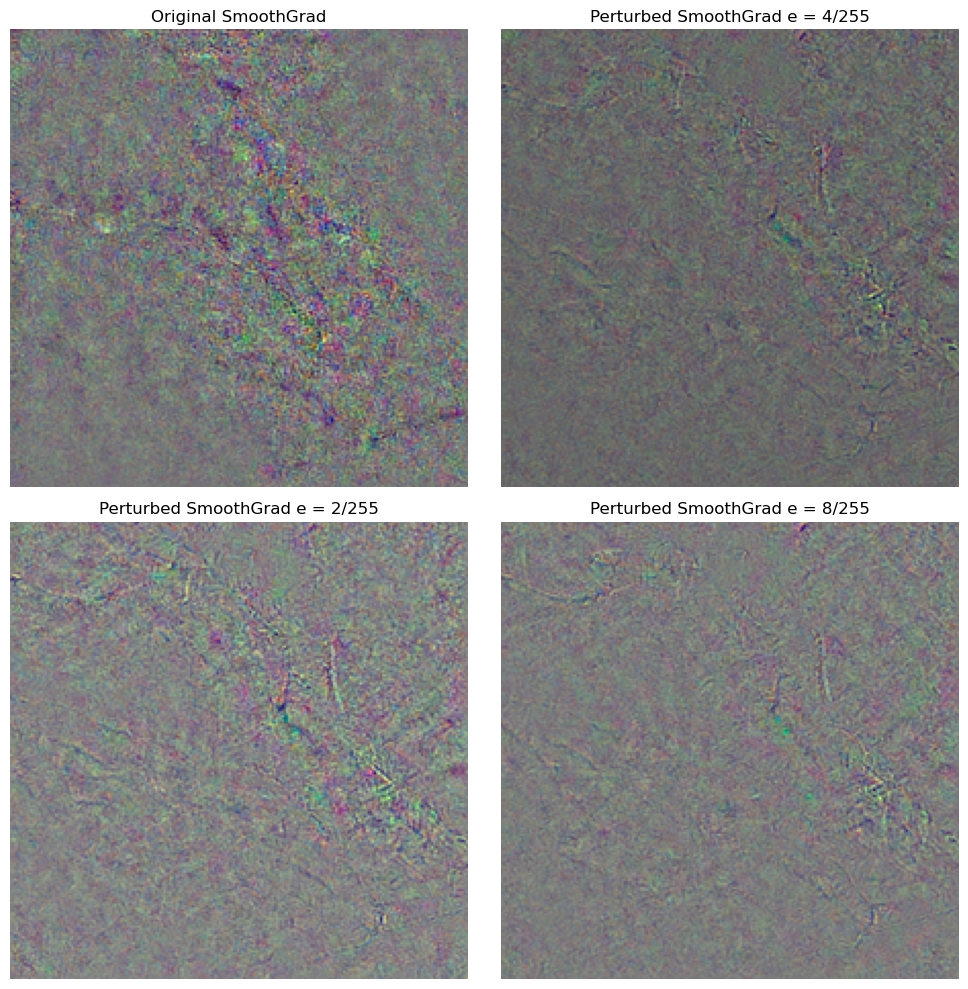

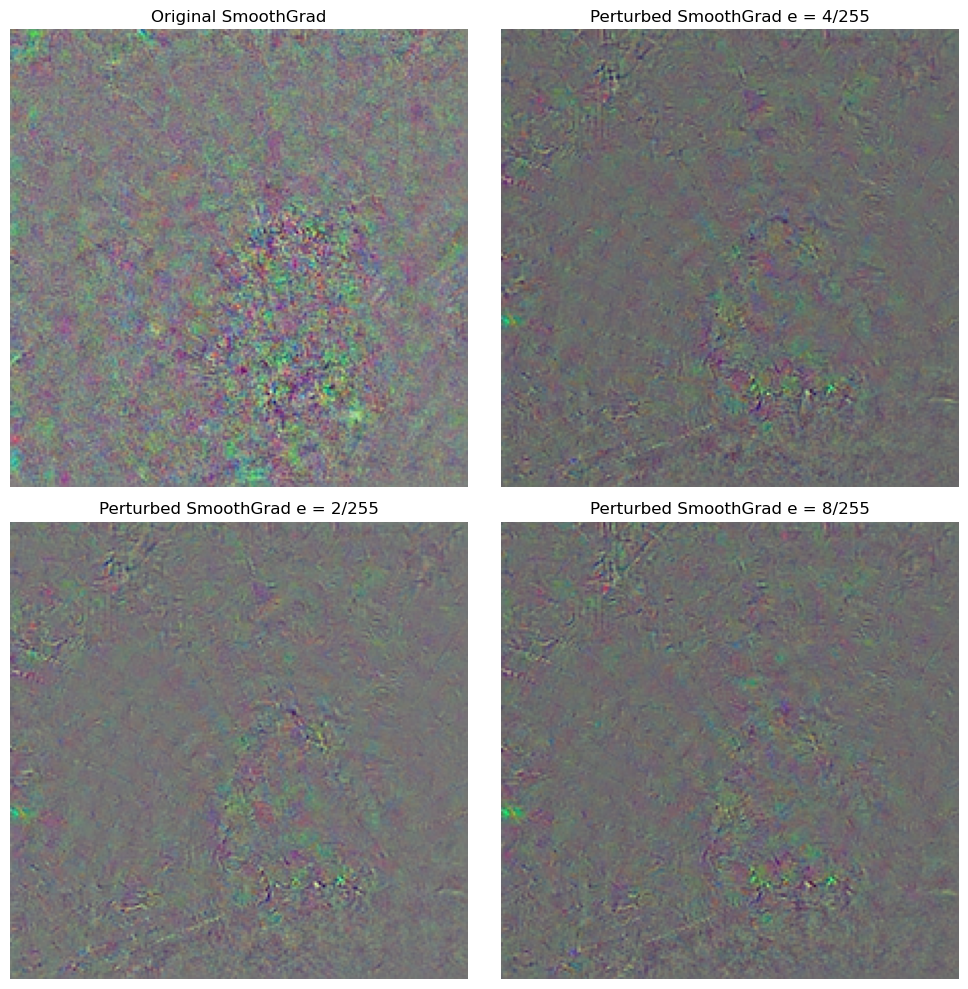

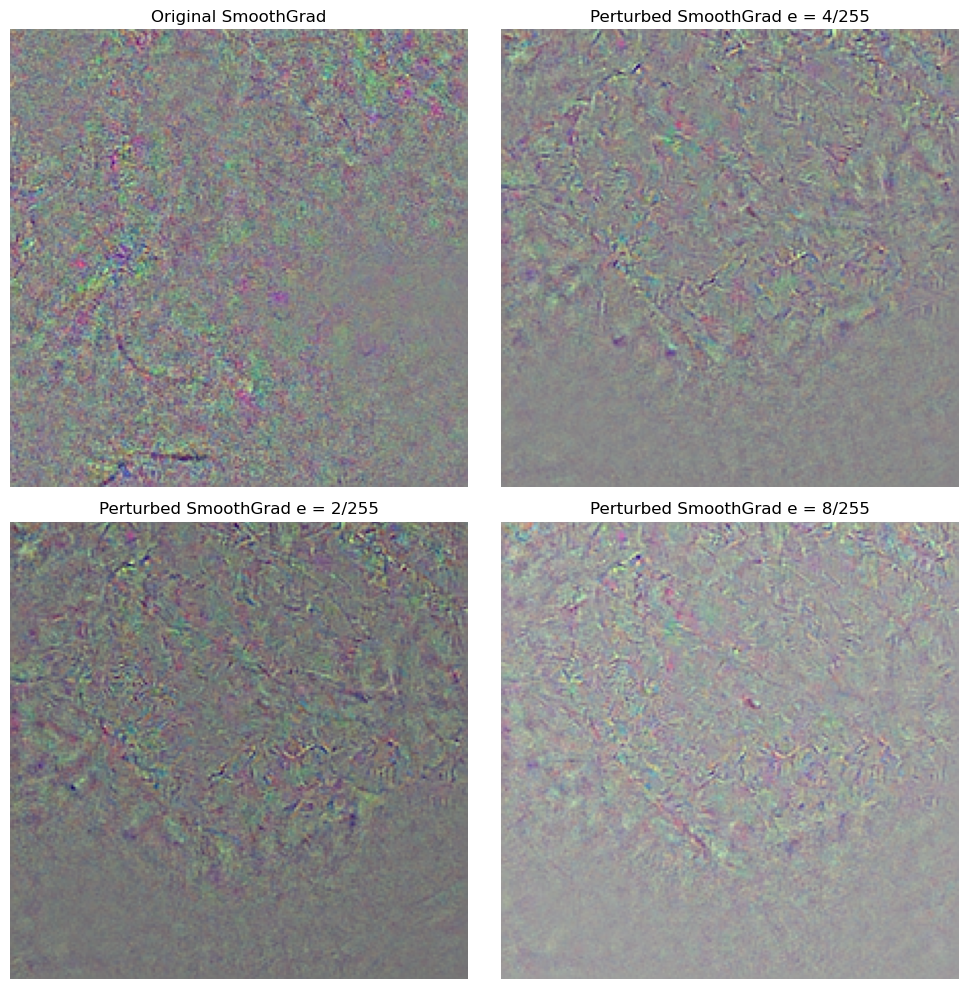

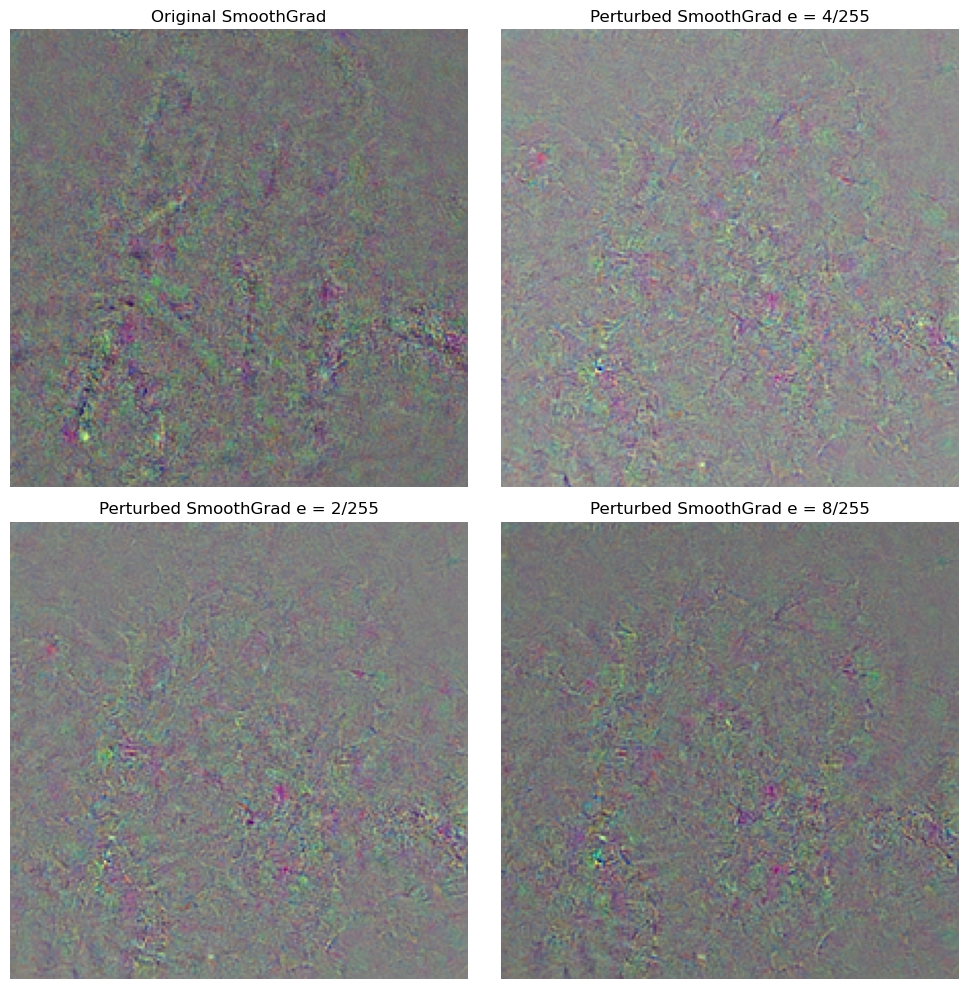

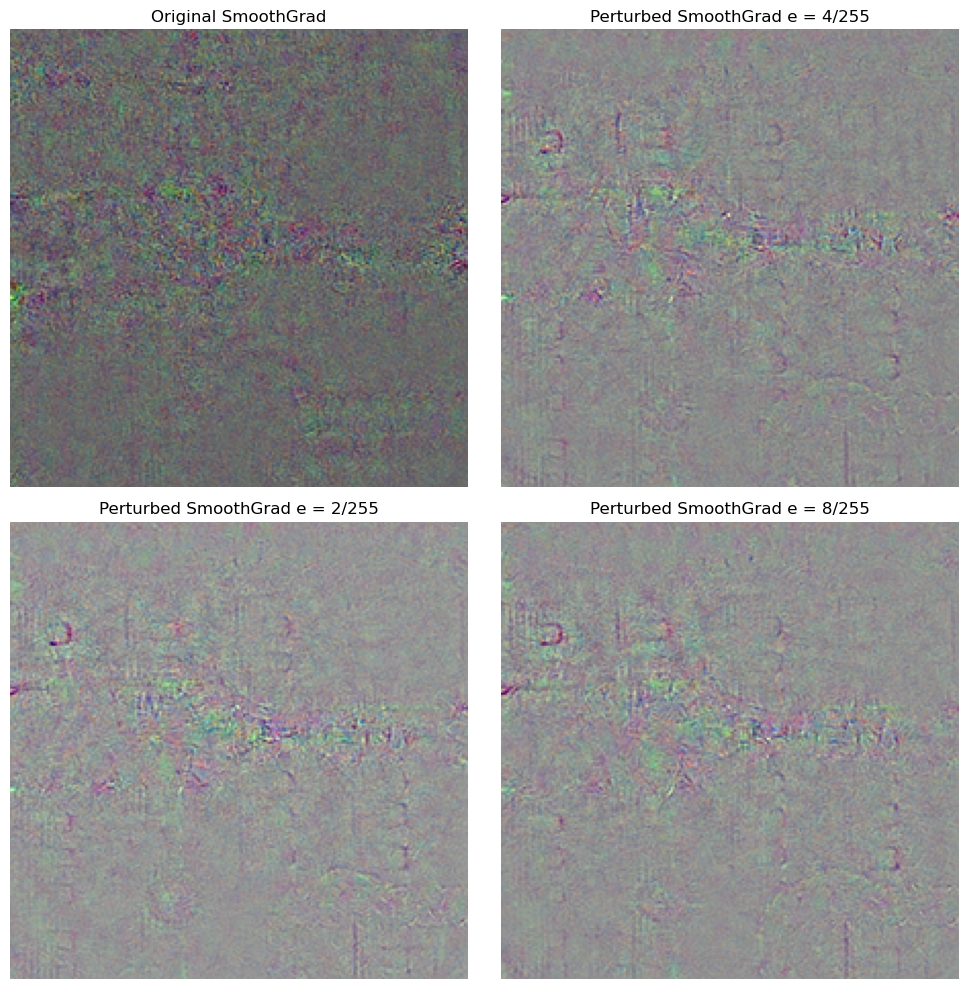

In [243]:
for img_path in image_paths:
    my_img = os.path.join(imagenet_path, img_path)
    input_image = Image.open(my_img).convert('RGB')
    input_tensor = preprocess(input_image)

    if torch.cuda.is_available():
        input_tensor = input_tensor.to('cuda')
        model.to('cuda')

    with torch.no_grad():
        output = model(input_tensor.unsqueeze(0))
        predicted_idx = torch.argmax(output, dim=1).item()

    smooth_grad_original = smoothGrad(input_tensor, 10, model, predicted_idx)
    smooth_grad_original -= smooth_grad_original.min()
    smooth_grad_original /= smooth_grad_original.max()



    perturbed_tensor = pgd_attack_smoothgrad(model, input_tensor, smooth_grad_original, predicted_idx,  2 / 255.0 , 10 / 255.0, 5, 1, 1)
    smooth_grad_perturbed = smoothGrad(perturbed_tensor, 10, model, predicted_idx)
    smooth_grad_perturbed -= smooth_grad_perturbed.min()
    smooth_grad_perturbed /= smooth_grad_perturbed.max()

    fig, ax = plt.subplots(2, 2, figsize=(10, 10))

    ax[0,0].imshow(np.transpose(smooth_grad_original.squeeze(),(1, 2, 0)), cmap="gray")
    ax[0,0].set_title("Original SmoothGrad")
    ax[0,0].axis("off")

    ax[1,0].imshow(np.transpose(smooth_grad_perturbed.squeeze(),(1, 2, 0)), cmap="gray")
    ax[1,0].set_title("Perturbed SmoothGrad e = 2/255")
    ax[1,0].axis("off")
    
    perturbed_tensor = pgd_attack_smoothgrad(model, input_tensor, smooth_grad_original, predicted_idx,  4 / 255.0 , 10 / 255.0, 5, 1, 1)
    smooth_grad_perturbed = smoothGrad(perturbed_tensor, 10, model, predicted_idx)
    smooth_grad_perturbed -= smooth_grad_perturbed.min()
    smooth_grad_perturbed /= smooth_grad_perturbed.max()
  
    ax[0,1].imshow(np.transpose(smooth_grad_perturbed.squeeze(),(1, 2, 0)), cmap="gray")
    ax[0,1].set_title("Perturbed SmoothGrad e = 4/255")
    ax[0,1].axis("off")

    perturbed_tensor = pgd_attack_smoothgrad(model, input_tensor, smooth_grad_original, predicted_idx,  8 / 255.0 , 10 / 255.0, 5, 1, 1)
    smooth_grad_perturbed = smoothGrad(perturbed_tensor, 10, model, predicted_idx)
    smooth_grad_perturbed -= smooth_grad_perturbed.min()
    smooth_grad_perturbed /= smooth_grad_perturbed.max()

    ax[1,1].imshow(np.transpose(smooth_grad_perturbed.squeeze(),(1, 2, 0)), cmap="gray")
    ax[1,1].set_title("Perturbed SmoothGrad e = 8/255")
    ax[1,1].axis("off")

    
    plt.tight_layout()
    plt.show()
